# 목표 : Create a deep learning model (i.e. Unet, GAN) to denoise low dose ct scans into what a routine dose would look like.

In [1]:
import pydicom
import matplotlib.pyplot as plt
import numpy as np
import csv
import pandas as pd
from torch.utils.data import Dataset, DataLoader
import os
import glob
import torch.nn as nn
import torch
import torch.optim as optim
from torchvision import transforms
from sklearn.model_selection import train_test_split
import kornia # sobel 연산을 위함 
import time
from torch.utils.data import Subset
import cv2

In [2]:
# 이미지 numpy array로 가져오는 함수 
def load_ct_img_arr(path):
    return pydicom.dcmread(path).pixel_array

# 이미지 시각화
def imshow(img_list,num,titles=[]):

    plt.figure(figsize = (10,10))

    for n in range(1,num+1):
        plt.subplot(1,num,n)
        if len(titles) != 0:
            plt.title(titles[n-1])
        print(f'{np.max(img_list[n-1])}')
        if np.max(img_list[n-1]) == 1.0 :
            img_list[n-1] *= 255
        
        plt.imshow(img_list[n-1], cmap='gray')

    plt.show()



# ct 이미지 값 전처리하기 0. ~ 1. 사이로 조정

def load_ct_img_arr(path):
    return pydicom.dcmread(path).pixel_array
    
def preprocessing_ct_img(img_arr):
    img_min = np.min(img_arr)
    img_max = np.max(img_arr)

    # 정규화한 이미지 0 ~ 1 사이로 min-max-scaling
    return (img_arr - img_min)/(img_max-img_min) 

# 이미지 로드 및 전처리
def load_and_preprocessing(img_path):
    img_dicom_arr = load_ct_img_arr(img_path)
    return preprocessing_ct_img(img_dicom_arr)

- meta data
  - 이미지 폴더 정보와 동일! ,
  - slice 두께
  - id, reconstruction kernel 종류, slice number, file path 를 보여줌

### CT windowing
- CT 이미지의 픽셀 값은 밝기 값이 아니라, 방사선 흡수율을 나타낸다.
- Bits Allocated : 16, Bits Stored : 12
- 12비트 정보가 저장되어있다. 2^12 = 4096
- reference :
- 1. https://www.kaggle.com/code/sparkyjunior/windowing-in-ct-scans
  2. https://89douner.tistory.com/336
- ![image.png](attachment:adde6af2-df43-4031-8d19-314847ed2507.png)
  - bit depth : 한 픽셀이 얼마나 많은 색상을 표현할 수 있는가
  - 8비트 이미지 : 0 ~ 255 까지의 256개의 색상을 표현할 수 있다.
  - 12비트 이미지 : 0 ~ 2^12 -1 까지 , 총 4096개의 색상을 표현할 수 있다.
    
- 전체 영역 중 보고 싶은 영역만 선택하고, 0~255 까지의 값을 가지도록 처리해준다.

### CGAN 모델 설계
- 정답 : Full Dose 이미지
- 입력 : Quater Dose 이미지
- Generator
- Discriminator
- 추가로 줄 정보 : slice 두께, sharp인지, soft 인지

### Dataset, Dataloader 만들기

#### self.data_list 형태

('/kaggle/input/datasets/andrewmvd/ct-low-dose-reconstruction/CT_low_dose_reconstruction_dataset/Original Data/Quarter Dose/1mm Slice Thickness/Sharp Kernel (D45)/L333/L333_QD_1_SHARP_1.CT.0004.0113.2016.01.21.18.22.35.459560.404824785.IMA', '/kaggle/input/datasets/andrewmvd/ct-low-dose-reconstruction/CT_low_dose_reconstruction_dataset/Original Data/Quarter Dose/1mm Slice Thickness/Sharp Kernel (D45)/L333/L333_QD_1_SHARP_1.CT.0004.0113.2016.01.21.18.22.35.459560.404824785.IMA', 0)

#### 조건
  - 0 : 1mm & Sharp
  - 1 : 1mm & Soft
  - 2 : 3mm & Sharp
  - 3 : 3mm & Soft


### 참고 자료
- https://tutorials.pytorch.kr/beginner/basics/data_tutorial.html
- gemini

In [3]:
def save_data_list(data,path):
    torch.save(data,path)
    print(f"성공적으로 저장되었습니다: {path}")

In [4]:
os.remove('/kaggle/working/data_list.pt')

In [62]:
os.listdir('/kaggle/input/datasets/andrewmvd/ct-low-dose-reconstruction/CT_low_dose_reconstruction_dataset/Original Data/Full Dose/3mm Slice Thickness/Soft Kernel (B30)/L333')


['full_3mm']

In [4]:
img_base_dir = '/kaggle/input/datasets/andrewmvd/ct-low-dose-reconstruction/CT_low_dose_reconstruction_dataset/Original Data'
quater_base_dir = '/kaggle/input/datasets/andrewmvd/ct-low-dose-reconstruction/CT_low_dose_reconstruction_dataset/Original Data/Quarter Dose'
full_base_dir = '/kaggle/input/datasets/andrewmvd/ct-low-dose-reconstruction/CT_low_dose_reconstruction_dataset/Original Data/Full Dose'


def extract_order_str(path):
    parts = path.split('.')
    try:
        return parts[3] # 0 , 1 ,2, 3번쨰에 있음! 
    except IndexError:
        return None
    
label_idx_list = []

class CTDataset(Dataset):
    def __init__(self, quater_base_dir, full_base_dir, transform = None, target_transform = None):
        self.input_base_dir = quater_base_dir
        self.target_base_dir = full_base_dir
        
        self.transform = transforms.Resize((256,256))

        self.target_transform = transforms.Resize((256,256))
        self.data_list = []
        self.preprocessed_img_list = []


        # 만약 저장된 data_list가 있다면?
        file_path ='/kaggle/working/data_list.pt'
        if os.path.isfile(file_path):
            print(f'저장된 dataset의 data_list(quater, full, label)이 존재합니다.')
            self.data_list = torch.load(file_path)

        else:
            print(f'dataset의 data_list(quater, full, label)을 생성합니다.')
                # 조건별 파일 경로 
            slice_conditions = ['1mm Slice Thickness', '3mm Slice Thickness']
            kernel_conditions = ['Sharp Kernel (D45)', 'Soft Kernel (B30)']
    
            # 이렇게하면 마지막 conds의 경로만 최종적으로 final_input_folder에 저장되게 된다. 

    
            label_idx = 0 
            label_idx_list.append(label_idx)
            for idx, sconds in enumerate(slice_conditions):
                # print(sconds)
                for idx, kconds in  enumerate(kernel_conditions):
                   
                    # print(kconds)
                    final_input_folder = os.path.join(self.input_base_dir, sconds, kconds)
                    final_target_folder = os.path.join(self.target_base_dir, sconds, kconds)
                    # print(label_idx)
    
                    sub_folders = sorted(os.listdir(final_input_folder))
                    for f in sub_folders:
                        input_sub_path = os.path.join(final_input_folder,f)
                        target_sub_path = os.path.join(final_target_folder,f)
                                
                        if (os.path.isdir(input_sub_path) and (os.path.isdir(target_sub_path))):
                            target_map = {}
                            for f in os.listdir(target_sub_path): 
                                order = extract_order_str(f) # 몇번째 순성니지 
                                if order:
                                    target_map[order] = os.path.join(target_sub_path,f)
                                    # order가 있으면 target_map의 order번째에 target 경로를 저장하자. 
                                else:
                                    # Full의 경우 full_3mm_sharp or full_3mm 인 경우가 있음 
                                    target_path = os.path.join(target_sub_path,f)
                                    for file in os.listdir(target_path):
                                        order_f = extract_order_str(file)
                                        if order_f:
                                            target_map[order_f] = os.path.join(target_path,file) 
                                            # 딕셔너리 구조 order_f : 경로 
                                        else:
                                            print('order_f가 존재하지 않습니다.')

                            for f in sorted(os.listdir(input_sub_path)):
                                order = extract_order_str(f)
                                # target_map내부에서 같은 order의 키가 잇는지 확인
                                if order in target_map:
                                    full_in_path = os.path.join(input_sub_path,f)
                                    full_out_path = target_map[order]
                                    self.data_list.append((full_in_path,full_out_path,label_idx))
                                else:
                                    continue
                                
                    
                    if  label_idx != 3:   
                        label_idx +=1
                        label_idx_list.append(label_idx)
                        #print(f'label : {label_idx}')
            
                        
            save_data_list(self.data_list,'./data_list.pt')
            
                        
    def __len__(self):
        return len(self.data_list) # 16628
        
    def __getitem__(self,idx):

        input_path = self.data_list[idx][0]
        target_path = self.data_list[idx][1]
        label = self.data_list[idx][2]
        
        
        input_img = load_and_preprocessing(input_path)
        target_img = load_and_preprocessing(target_path)
    
        input_tensor = torch.tensor(input_img).unsqueeze(0) # 배치 차원 추가 
        target_tensor = torch.tensor(target_img).unsqueeze(0)
    
        resized_input_tensor = self.transform(input_tensor)
        resized_target_tensor = self.target_transform(target_tensor)
        label_tensor = torch.tensor(label)

        return resized_input_tensor,resized_target_tensor,label_tensor


        
# 데이터셋 만들기

ct_dataset = CTDataset(quater_base_dir,full_base_dir)
# print(f'end-start :{end_time - start_time}') # 여기는 0.13

 
# # 훈랸용 , 테스트용 분리 -> 이게 속도 느림의 원인이었음 
dataset_index = np.arange(0,len(ct_dataset))

data_list = np.array(ct_dataset.data_list)
labels = [str(data[2]) for data in data_list]
train_dataset_index , test_dataset_index = train_test_split(dataset_index,test_size= 0.2,shuffle = True,random_state = 42,stratify=labels)
# len(dataset.data_list) # 16628 동일 
train_dataset = Subset(ct_dataset,train_dataset_index)
test_dataset =Subset(ct_dataset,test_dataset_index )
# print(f'end-start :{end_time - start_time}') #302초 => 약 5분 소요!!!  -> 0.035634375999961776로 단축!!! 



# 데이터로더 만들기
ct_train_dataloader = DataLoader(train_dataset, batch_size= 2, shuffle=True,num_workers=2)
# print(f'end-start :{end_time - start_time}') #0.0029896619998908136

ct_test_dataloader = DataLoader(test_dataset, batch_size= 2, shuffle=False)

저장된 dataset의 data_list(quater, full, label)이 존재합니다.


### 데이터셋, 데이터 로더 구성 시 속도가 느림

매번 각 path마다 이미지를 load, preprocessing, resize해서 오래걸리는 듯
개선이 필요함 

- 개선 완료
- 관련 링크 : https://stackoverflow.com/questions/62968187/why-does-train-test-split-take-a-long-time-to-run
- 방법 : 인덱스를 train_test_split해서 사용 !!

In [5]:
len(ct_train_dataloader) ,len(ct_test_dataloader)

(6651, 1663)

- datalist 저장해두기

### CGAN 모델 구현

In [6]:
class ConvBlock(nn.Module):
    def __init__(self,in_channels, out_channels, kernel_size = 3 , stride = 1,padding = 1):
        '''
        in_channels : 입력 이미지의 채널 수 , 우리는 1 
        output_channels : convolution으로 만들어진 채널 수  ,1 
        kernel_size : convolution kernel의 크기 
        '''
        super().__init__()
        
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels = in_channels, out_channels =  out_channels, kernel_size = kernel_size, stride = stride,padding = padding ),
            nn.BatchNorm2d(num_features = out_channels),
            nn.ReLU(),
            nn.Conv2d(in_channels = out_channels, out_channels =  out_channels , kernel_size = kernel_size, stride = stride , padding = padding),
            nn.BatchNorm2d(num_features = out_channels),
            nn.ReLU()
        )

    def forward(self,x):
        return self.conv(x)

class EncoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels, num_conditions = 0, kernel_size= 3, stride = 1):
        super().__init__()
        self.convblock = ConvBlock(in_channels + num_conditions, out_channels, kernel_size, stride)
        self.maxpooling = nn.MaxPool2d((2,2))

    def forward(self,x):
        features = self.convblock(x)
        p = self.maxpooling(features)
        return features,p
        

class DecoderBlock(nn.Module):
    def __init__(self,in_channels, out_channels, kernel_size = 2, stride = 2):
        super().__init__()
        
        self.upconv = nn.ConvTranspose2d(in_channels = in_channels, out_channels = out_channels, kernel_size = kernel_size, stride = 2)
        self.conv = ConvBlock(in_channels = out_channels * 2 , out_channels = out_channels, kernel_size = 3, stride = 1,padding = 1)
        self.conv2 = ConvBlock(in_channels = out_channels, out_channels = out_channels, kernel_size = 3, stride = 1, padding = 1)
    
    def forward(self,encoder_output,decoder_output):
        # encoder output : 특징을 추출하는 앞단 과정에서 만든 feature map
        # decoder output : 전 decoder에서 만든  feature map을 transposed convolution을 통해 맵의 차원을 두 배로 늘려서 채널 수를 반으로 줄인 것 

        
        inputs = self.upconv(decoder_output)
        
        inputs = torch.cat([inputs, encoder_output],dim = 1) # 앞단에서 conv 결과 feature map
        
        output = self.conv(inputs)
        output = self.conv2(output)
        return output

class Unet(nn.Module):
    def __init__(self,num_conditions = 0):
        super().__init__()

        # Encoder 
        self.e1 = EncoderBlock(1,16,num_conditions=num_conditions)  # C,H,W = 16,256,256 
        self.e2 = EncoderBlock(16,32) # C,H,W = 32,256,256 
        self.e3 = EncoderBlock(32,64) # C,H,W = 64,256,256 
        self.e4 = EncoderBlock(64,128) #  C,H,W = 128,256,256 
    
        #  Bridge
        self.b1 = ConvBlock(128,256) # C,H,W = 256,256,256 
    
        # Decoder
        self.d1 = DecoderBlock(in_channels = 256,out_channels = 128) # 여기서 에러 발생 
        self.d2 = DecoderBlock(128,64)
        self.d3 = DecoderBlock(64,32)
        self.d4 = DecoderBlock(32,16)
    
        # output 
        self.output = nn.Conv2d(16,1,kernel_size = 1) 
        # 여기서 ConvBlock을 하면 안됨 이미 DecoderBlock을 통해 2번의 conv가 수행됨! 마지막에는 최종 이미지 1채널 만 뽑애내면 된다! 

    def forward(self,x):
        # Encoder 
        e_output1 ,e_pooled_1 = self.e1(x) # 16,256,256 , 16,128,128
        e_output2, e_pooled_2 = self.e2(e_pooled_1) # 32 ,256,256 , 32,128,128,

        e_output3, e_pooled_3 = self.e3(e_pooled_2) # 64,256,256 ,  64,128,128

        e_output4, e_pooled_4 =  self.e4(e_pooled_3) # 128,256,256, 128,128,128,


        # Bridge
        e_output = self.b1(e_pooled_4) # 256 ,256, 256 

        # Decoder

        d_output1 = self.d1(e_output4, e_output) # 256, 128,
        d_output2 = self.d2(e_output3, d_output1) # 128, 64
        d_output3 = self.d3(e_output2, d_output2) # 64, 32
        d_output4 = self.d4(e_output1, d_output3) # 32,16
        outputs =  self.output(d_output4) 
        
        return torch.sigmoid(outputs)

### CGAN 모델 구현하기

In [7]:
# 이미지 사이즈 256 x 256 
# Generator : 입력 이미지와 같은 크기의 이미지를 생성해야하므로, 저해상도와 고해상도 정보를 모두 보존하는 Unet 사용
# discriminator : 판별자는 이미지를 생성하는 것이 아니라 입력된 이미지가 진짜인지 가짜인지를 판단하는 것이다. 
# 따라서 Unet구조는 비효율적일 수 있음 


# residual 형태로 변환하기 
class Generator(nn.Module):
    
    def __init__(self, num_classes= 4, chan_conditions =32):
        super().__init__()
       
        self.embedding = nn.Embedding(num_embeddings = num_classes, embedding_dim = chan_conditions) # 4개의 클래스를 32차원으로 만들어주기 ! 
        # 4개의 조건 조합들을 32 차원으로 표현해준다.

        self.label_projector = nn.Sequential(
            nn.Linear(chan_conditions,256 * 256),
            nn.ReLU()
        )

        # Unet 구조  
        # 이미지 크기 256 x 256 
        self.model = Unet(num_conditions = 1)

    def forward(self,img, label):
        label = self.embedding(label)
        label = self.label_projector(label)
        label_map = label.view(-1,256,256)

        img = torch.cat([img, label_map.unsqueeze(1)],dim = 1)
        return self.model(img) # tanh 적용 결과가 나옴 , 



class Discriminator(nn.Module):
    def __init__(self,in_channels = 2,num_classes= 4, chan_conditions=32):
        super().__init__()

        # 조건 embedding
        self.embedding = nn.Embedding(num_embeddings = num_classes, embedding_dim = chan_conditions) # 4개의 클래스를 32차원으로 만들어주기 ! 
        
       # 일반적인 CNN 사용하기 
        # 조건이 주어진 상태에서 입력받은 이미지가 진짜인지, 가짜인지 확률 계산하는 것 
        # stride = 2 : 이미지를 두 칸씩 건너뛰며 훑기 때문에, 결과물의 가로 세로 크기가 절반씩 줄어든다. 
        def conv_block(in_f,out_f,stride = 2):
            return nn.Sequential(
            nn.Conv2d(in_f, out_f , kernel_size = 4, stride = stride, padding =1),
            nn.BatchNorm2d(out_f),
            nn.LeakyReLU(0.2, inplace = True)
        )

        self.model = nn.Sequential(
            conv_block(in_channels,16),
            conv_block(16,32),
            conv_block(32,64),
            conv_block(64,128),
            nn.Conv2d(128, 1, kernel_size = 3, stride = 1, padding = 1)  # kernel size : 16 -> 3 
            # 128 x 16 x 16 -> 1 x 16 x 16 
        )

        self.label_projector = nn.Sequential(
                nn.Linear(chan_conditions,256 * 256),
                nn.ReLU()
        )
   
    def forward(self,img,label):
        label = self.embedding(label)
        label = self.label_projector(label)
        label_map = label.view(-1,256,256)
        img = torch.cat([img.float(), label_map.unsqueeze(1)],dim = 1)
        output = self.model(img)
        # print(f'discriminator output :{output.shape}')
        # print(f'discriminator output shape:{output.shape}')
        # discriminator output shape:torch.Size([2, 1, 16, 16])
        return output # logits 그대로 출력

### 학습 루프

In [14]:
# 모델 저장

def save_model_checkpoint(discriminator, generator,optimizer_G, optimizer_D,path):
    torch.save(
       { 'discriminator' : discriminator.state_dict(),
        'generator' : generator.state_dict(),
        'optimizer_G' : optimizer_G.state_dict(),
        'optimizer_D' : optimizer_D.state_dict()
       },
        path
    )

def load_model_checkpoint(path):
    checkpoint = torch.load(path, weights_only=False,map_location = device)
    return checkpoint

In [9]:
# discriminaor 모델 kernel size = 3로 변경
generator_v2, discriminator_v2 = Generator().to(device), Discriminator().to(device)

NameError: name 'device' is not defined

In [15]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# generator, discriminator 초기화
generator, discriminator = Generator().to(device), Discriminator().to(device)

path = '/kaggle/working/model.pt'


# optimizer
optimizer_G = optim.Adam(generator.parameters(), lr = 0.00002, betas = (0.5, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr = 0.00002, betas = (0.5, 0.999))

In [16]:
def plot_loss(loss_g_list, loss_d_list):
    plt.figure(figsize=(10, 5))
    plt.title("Generator and Discriminator Loss During Training")

    # 생성자 Loss 그래프
    plt.plot(loss_g_list, label="G (Generator)", color='blue', alpha=0.7)
    # 판별자 Loss 그래프
    plt.plot(loss_d_list, label="D (Discriminator)", color='red', alpha=0.7)

    plt.xlabel("Epochs")
    plt.ylabel("Loss Value")
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.show()
    
def save_loss_list(loss,path):
    torch.save(loss,path)
def load_loss_list(path):
    checkpoint = torch.load(path)
    return checkpoint
loss_d_list, loss_g_list= load_loss_list('/kaggle/working/loss_d.pt'),load_loss_list('/kaggle/working/loss_g.pt')

### 학습 루프 

In [10]:
path = '/kaggle/working/model_0427_model_v2.pt' # epoch 10  

# model_0423 : GAN Loss만 사용한 모델 
# model_0423_add_L1 : model_0423에 추가로 epoch 5번 L1 Loss를 추가한 모델 

# 저장된 파일이 있다면 적용해주기 
if os.path.isfile(path):
    print('저장된 checkpoint가 있습니다.')
    checkpoint = load_model_checkpoint(path)
    generator.load_state_dict(checkpoint['generator'])
    discriminator.load_state_dict(checkpoint['discriminator'])
    optimizer_G.load_state_dict(checkpoint['optimizer_G'])
    optimizer_D.load_state_dict(checkpoint['optimizer_D'])
else:
    print('저장된 모델이 없습니다.')

# Loss function  
criterion_gan = nn.BCEWithLogitsLoss()  # mean squared error 평균 제곱 오차  , BCE
criterion_L1 = nn.L1Loss()
# sobel edge

criterion_sobel = nn.L1Loss()

low_dose_ct_test, full_dose_ct_test, label_test = next(iter(ct_train_dataloader))


# 먼저 test, train 분리하는 것 부터 짜기 

# def test_one_epoch(epoch):

def train_one_epoch(epoch,discriminator, generator):

        discriminator.train()
        generator.train()
    
        one_epoch_loss_g = 0.
        one_epoch_loss_d = 0.
        loss_gan = 0.
        loss_L1 = 0.
        loss_sobel = 0.
    
        for q_ct, f_ct, label in ct_train_dataloader:
            q_ct= q_ct.to(device).float()
            f_ct= f_ct.to(device).float()
            label = label.to(device)

            # target_noise = f_ct - q_ct
                 
            # 1. Discriminator 학습
            
            optimizer_D.zero_grad()
            
            # 진짜 이미지 판별 
            pred_real = discriminator(f_ct, label) # shape 2, 1, 16 16 
            # 정답지 만들어두기 
            label_real = torch.ones_like(pred_real) 
            # print(f'label shape :{label_real.shape}')
            label_fake = torch.zeros_like(pred_real)
            
            loss_d_real = criterion_gan(pred_real, label_real) # logits를 넣어줘야함 , 판별자가 진짜 이미지를 보고 진짜라고 예측할 확률 
                
            #  가짜 이미지 판별 
            fake_ct = generator(q_ct, label) # 가짜 이미지 , sigmoid가 적용된 결과가 나온다. 
            pred_fake =  discriminator(fake_ct.detach(), label) # NxN 패치 예측값들이 나온다. 판별자가 가짜 이미지를 보고 내린 예측값
            loss_d_fake = criterion_gan(pred_fake, label_fake) # 판별자의 예측값과 0 간의 차이를 나타냄 
            
            # 손실 함수
            loss_d = loss_d_real + loss_d_fake
            one_epoch_loss_d += loss_d.item()
            loss_d.backward() # backward학습 시 fake_ct를 만든 계산 기록들이 없어졌따! 
            optimizer_D.step()
            
            # 2. Generator 학습
            optimizer_G.zero_grad()
            
            # discriminator 속이기 
            pred_fake = discriminator(fake_ct, label)
            loss_g_gan = criterion_gan(pred_fake, label_real)
            
            # 실제 정답과의 픽셀 차이 
          #  print(f'fake_ct range:{fake_ct.min()},{fake_ct.max()}') # -1 ~ 1 사이 
           # print(f'f_ct : {f_ct.min()}, {f_ct.max()} ') # 0 ~ 1 사이 
            loss_g_L1= criterion_L1(fake_ct, f_ct) * 100

            # 생성한 이미지의 edge
            # generated_edge = kornia.filters.spatial_gradient(fake_ct,mode='sobel',order = 1)
            # target_edge = kornia.filters.spatial_gradient(f_ct, mode = 'sobel',order = 1)
            
            # 정답 이미지의 edge
            #loss_g_sobel = criterion_sobel(generated_edge,target_edge) * 0.01 # 비율 학습하면서 조정해보기 , 1) 0.01 -> 0.008 -> 0.009(V7) -> 0.01(4/27 model train)
            
            # print(f'loss_g_L1 : {loss_g_L1.item()}')
            loss_g = loss_g_gan + loss_g_L1  # loss_g_sobel
            
            loss_gan += loss_g_gan.item()
            loss_L1 += loss_g_L1.item()
           # loss_sobel += loss_g_sobel.item()
            
            one_epoch_loss_g += loss_g.item()
            loss_g.backward()
            optimizer_G.step()

        epoch_loss_gan = loss_gan / len(ct_train_dataloader)
        epoch_loss_L1 = loss_L1 / len(ct_train_dataloader)
    #    epoch_loss_sobel = loss_sobel / len(ct_train_dataloader) 

        final_loss_d = one_epoch_loss_d/len(ct_train_dataloader)
        final_loss_g = one_epoch_loss_g/len(ct_train_dataloader)
        print(f'Epoch {epoch} Discriminator Loss : {final_loss_d}, Generator Loss : {final_loss_g}')
        print(f'Epoch {epoch} Generator 학습 중 Loss Gan {epoch_loss_gan}, L1 Loss : {epoch_loss_L1} ')
        return final_loss_d, final_loss_g
            
for epoch in range(5):
        loss_d, loss_g = train_one_epoch(epoch,discriminator, generator)
        loss_d_list.append(loss_d)
        loss_g_list.append(loss_g)
        if epoch % 2 == 0:
            # 시각화 해보기 
            low_dose_ct_test, full_dose_ct_test = low_dose_ct_test.to(device), full_dose_ct_test.to(device)
            label_test = label_test.to(device)
            print(f'label : {label_test}')
            generated_img_test = make_ct_image(low_dose_ct_test,label_test,generator)
            # minus_imgs_test = np.abs(generated_img_test.cpu(),full_dose_ct_test.cpu())
            diff_origin = np.abs(np.subtract(full_dose_ct_test.cpu() , low_dose_ct_test.cpu())) * 10
            diff = np.abs(np.subtract(full_dose_ct_test.cpu(),generated_img_test.cpu())) * 10
            
            show_images(low_dose_ct_test,label_list = ['Low Dose Image 1','Low Dose Image 2'])
            show_images(generated_img_test,label_list = ['Generated Image1 ','Generated Image 2'])
            show_images(full_dose_ct_test,label_list = ['Full Dose Image1 ','Full Dose Image 2'])
            show_images(diff_origin,label_list =['Full Dose - Low Dose Image 1','Full - Low  Image 2'],cmap_type='jet')
            show_images(diff ,label_list = ['F - G Image1 ','F-G Image2'],cmap_type='jet' )
            
save_model_checkpoint(discriminator, generator,optimizer_G,optimizer_D, path = f'/kaggle/working/model_0430.pt')

# /kaggle/working/model_0427_model_v2.pt 여기세 0430 모델 첫 10 epoch 저장됨 
save_loss_list(loss_g_list,'/kaggle/working/loss_g.pt')
save_loss_list(loss_d_list,'/kaggle/working/loss_d.pt')

저장된 checkpoint가 있습니다.


NameError: name 'load_model_checkpoint' is not defined

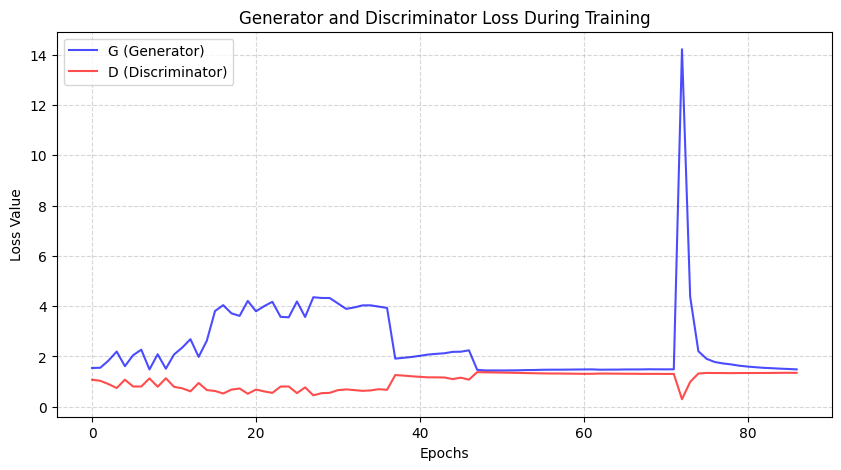

In [17]:
plot_loss(loss_g_list,loss_d_list)

In [60]:
c = load_loss_list('/kaggle/working/loss_g.pt')
c

[1.542571563762644,
 1.5516589903917515,
 1.8385073788639943,
 2.196230076682458,
 1.614142770951645,
 2.0492894390017944,
 2.2705921816245147,
 1.483350520473802,
 2.0894184106096363,
 1.513130660971884,
 2.080929171763906,
 2.353590712262677,
 2.688322787069052,
 1.9841194946440408,
 2.628104540189932,
 3.806585273139012,
 4.04147020936317,
 3.717456151445796,
 3.6144402432918477,
 4.209228086374771,
 3.7972302292006623,
 4.001294541315931,
 4.17444113793543,
 3.5769924240495152,
 3.557507967110093,
 4.1882148113954765,
 3.5713687100960354,
 4.355424612881528,
 4.327252286033619,
 4.325027886861573,
 4.109580181914332,
 3.8938529707223664,
 3.949575149821188,
 4.032217094385969,
 4.034245198695324,
 3.9817852935402436,
 3.9304367287717104]

## 확인해볼 것 
- 라벨 2,3도 잘 들어가있는지 확인해보기
- 학습이 진행됨에따라서 결과 이미지가 어떻게 달라지는지 정리하기, 이유 찾아보기(Loss와 연관지어서!)
- 이미지 주파수로 변환 후 시각화 해보기 

In [ ]:
# 모델 중간 저장
# V7 : edge loss 가중치 0.09
save_model_checkpoint(discriminator, generator,optimizer_G,optimizer_D, path ='/kaggle/working/model_v7.pt')

In [63]:
generator1, discriminator1 = Generator().to(device), Discriminator().to(device)
generator2, discriminator2 = Generator().to(device), Discriminator().to(device)
generator3, discriminator3 = Generator().to(device), Discriminator().to(device)
generator4 ,discriminator4 = Generator().to(device), Discriminator().to(device)

generator5 ,discriminator5 = Generator().to(device), Discriminator().to(device)
generator6 ,discriminator6 = Generator().to(device), Discriminator().to(device)
generator9 ,discriminator9 = Generator().to(device), Discriminator().to(device)


checkpoint1 = load_model_checkpoint('/kaggle/working/model_0423_add_L1.pt')
generator1.load_state_dict(checkpoint1['generator'])
discriminator1.load_state_dict(checkpoint1['discriminator'])


# checkpoint_v2 = load_model_checkpoint(path='/kaggle/working/model_v2.pt')
# generator2.load_state_dict(checkpoint_v2['generator'])
# discriminator2.load_state_dict(checkpoint_v2['discriminator'])

# checkpoint_v3 = load_model_checkpoint('/kaggle/working/model_v3.pt')
# generator3.load_state_dict(checkpoint_v3['generator'])
# discriminator3.load_state_dict(checkpoint_v3['discriminator'])

# checkpoint_v4 = load_model_checkpoint('/kaggle/working/model_v4.pt')
# generator4.load_state_dict(checkpoint_v4['generator'])
# discriminator4.load_state_dict(checkpoint_v4['discriminator'])


# checkpoint_v5 = load_model_checkpoint('/kaggle/working/model_v5.pt')
# generator5.load_state_dict(checkpoint_v5['generator'])
# discriminator5.load_state_dict(checkpoint_v5['discriminator'])

# checkpoint_v6 = load_model_checkpoint('/kaggle/working/model_v6.pt')
# generator6.load_state_dict(checkpoint_v6['generator'])
# discriminator6.load_state_dict(checkpoint_v6['discriminator'])

# checkpoint_v9 = load_model_checkpoint('/kaggle/working/model_epoch9.pt')
# generator9.load_state_dict(checkpoint_v9['generator'])
# discriminator9.load_state_dict(checkpoint_v9['discriminator'])


RuntimeError: PytorchStreamReader failed reading zip archive: failed finding central directory

# ssim 라이브러리 설치

In [18]:
pip install pytorch-ssim

  Preparing metadata (setup.py) ... done
  Created wheel for pytorch-ssim: filename=pytorch_ssim-0.1-py3-none-any.whl size=2006 sha256=c055ce2485556e30987f07e42ad98ed6922641c1f44302a37ec54837893e452c
  Stored in directory: /root/.cache/pip/wheels/54/a0/11/99f86224e71729ed9ef0c4ffe1b795807ad5f44bde19bc66f9
Successfully built pytorch-ssim
Note: you may need to restart the kernel to use updated packages.


In [19]:
pip install piq

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.9/106.9 kB 4.3 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


# fid 라이브러리 설치 : https://github.com/mseitzer/pytorch-fid

In [15]:
pip install pytorch-fid

Note: you may need to restart the kernel to use updated packages.


In [20]:
def make_ct_image(low_dose_ct, label,generator):

    # 3. 기울기 계산 없이 이미지 생성 (메모리 절약)
    with torch.no_grad():
        # print(low_dose_ct.shape)
        # print(label.shape)
        generated_images = generator(low_dose_ct.to(device).float(), label.to(device))
    return generated_images

def show_images(images, num_images = 2,label_list=[],cmap_type='gray'):
    # 텐서를 CPU로 옮기고 넘파이 배열로 변환
    images = images.detach().cpu().numpy()
    
    fig, axes = plt.subplots(1, num_images, figsize=(15, 5),squeeze=False)
    axes = axes.flatten()
    for i in range(num_images):
        # [C, H, W] -> [H, W, C]로 차원 변경 (Matplotlib 규격)
        img = images[i].transpose(1, 2, 0)
        
        # 만약 Tanh를 써서 -1 ~ 1 사이라면 0 ~ 1로 정규화
        img = (img + 1) / 2
        
        axes[i].imshow(img, cmap=cmap_type if img.shape[2] == 1 else None)
        axes[i].axis('off')
        axes[i].set_title(f"Label: {label_list[i]}")
    plt.show()

In [21]:
from skimage.metrics import structural_similarity as ssim 

# def test_one_epoch(epoch, discriminator, generator):
#     discriminator.eval()
#     generator.eval()

#     with torch.no_grad():
#         # 새로운 이미지 만들어보기 
#         for low_dose_ct, full_dose_ct,label in ct_test_dataloader:
            
            
def get_psnr(full_dose_ct, generated_img,max_value = 1.0):
    full_dose_arr = full_dose_ct.cpu()
    generated_arr = generated_img.cpu()
    # 1. mse 구하기
    mse = torch.mean((full_dose_arr - generated_arr)**2)
    psnr = 10 * torch.log10((max_value)**2 / mse)
    return psnr.item()

def get_ssim(full_dose_ct, generated_img):
    # 입력 ndarray 형태 이어야한다! 

    # print(f'full_dose_ct :{full_dose_ct.shape}')
    # print(f'generated_img :{generated_img.shape}')
    
    if full_dose_ct.ndim == 4:
        full_dose_arr = full_dose_ct.cpu().numpy().squeeze(0).squeeze(0)
        generated_arr = generated_img.cpu().numpy().squeeze(0).squeeze(0)
    elif full_dose_ct.ndim == 3:
        full_dose_arr = full_dose_ct.cpu().numpy().squeeze(0)
        generated_arr = generated_img.cpu().numpy().squeeze(0)
    elif full_dose_ct.ndim ==2:
        full_dose_arr = full_dose_ct.cpu().numpy()
        generated_arr = generated_img.cpu().numpy()
        
    ssim_score = ssim(full_dose_arr,generated_arr, data_range = 1.0, )

    # score : 이미지 전체 평균 ssim 수치
    # diff : SSIM Map (차이 지도), 이미지의 어디가 많이 망가졌는지 
    return ssim_score

# def get_epi(full_dose_ct, generated_img):
#     full_arr = full_dose_ct.cpu().numpy().squeeze(0).squeeze(0)
#     generated_arr = generated_img.cpu().numpy().squeeze(0).squeeze(0)

#     full_sobel_x = cv2.Sobel(full_dose_ct,cv2.CV_64F, 1,0,ksize=3)
#     full_sobel_y = cv2.Sobel(full_dose_ct, cv2.CV_64F, 0,1,ksize =4)

#     magnitude = 

### EPI 지표 : 원본과 개선된 영상의 저주파 성분을 제거하고 고주파 성분만을 추출한 후 두 고주파 성분 영상 간의 유사도를 측정

In [29]:
from piq import gmsd

def get_psnr_ssim(full_ct,generated_img):
    psnr = get_psnr(full_ct,generated_img)
    ct_ssim = get_ssim(full_ct,generated_img)

    gmsd_value = gmsd(full_ct,generated_img, data_range=1.)
    print(f'psnr : {psnr}, ssim: {ct_ssim}, gmsd : {gmsd_value}')


In [54]:
# 조건별 이미지 리스트
# 1. 1mm & Sharp

# 2. 1mm & Soft
# 3. 3mm & Sharp
# 3. 3mm & Soft

transform = transforms.Resize((256,256))

path ='/kaggle/working/model_0426_model_update_.pt'
path2 ='/kaggle/working/model_0427_model.pt'
path3 = '/kaggle/working/model_0430.pt'

if os.path.isfile(path2):
    print('저장된 checkpoint가 있습니다.')
    checkpoint = load_model_checkpoint(path2)
    generator.load_state_dict(checkpoint['generator'])
    discriminator.load_state_dict(checkpoint['discriminator'])
    optimizer_G.load_state_dict(checkpoint['optimizer_G'])
    optimizer_D.load_state_dict(checkpoint['optimizer_D'])

    

def get_img_tensor(input_path, target_path,label,generator):
    input_img = load_and_preprocessing(input_path)
    target_img = load_and_preprocessing(target_path)
    
    input_tensor = torch.tensor(input_img).unsqueeze(0).unsqueeze(0)
    target_tensor = torch.tensor(target_img).unsqueeze(0).unsqueeze(0)
    input_resized , target_resized = transform(input_tensor), transform(target_tensor)
    generated_tensor =  make_ct_image(input_resized,label,generator)
    return input_resized , target_resized ,generated_tensor

# Condition 0    
input_path0 = '/kaggle/input/datasets/andrewmvd/ct-low-dose-reconstruction/CT_low_dose_reconstruction_dataset/Original Data/Quarter Dose/1mm Slice Thickness/Sharp Kernel (D45)/L109/L109_QD_1_SHARP_1.CT.0004.0001.2016.01.21.13.27.23.157278.138324982.IMA'
target_path0 = '/kaggle/input/datasets/andrewmvd/ct-low-dose-reconstruction/CT_low_dose_reconstruction_dataset/Original Data/Full Dose/1mm Slice Thickness/Sharp Kernel (D45)/L109/L109_FD_1_SHARP_1.CT.0002.0001.2016.01.21.13.26.29.449778.138299662.IMA'

# Condition 1 
input_path1 = '/kaggle/input/datasets/andrewmvd/ct-low-dose-reconstruction/CT_low_dose_reconstruction_dataset/Original Data/Quarter Dose/1mm Slice Thickness/Soft Kernel (B30)/L109/L109_QD_1_1.CT.0003.0001.2015.12.23.17.53.56.544757.125862991.IMA'
target_path1 = '/kaggle/input/datasets/andrewmvd/ct-low-dose-reconstruction/CT_low_dose_reconstruction_dataset/Original Data/Full Dose/1mm Slice Thickness/Soft Kernel (B30)/L109/L109_FD_1_1.CT.0001.0001.2015.12.23.17.52.25.829117.125758448.IMA'

# Condition 2 
input_path2 = '/kaggle/input/datasets/andrewmvd/ct-low-dose-reconstruction/CT_low_dose_reconstruction_dataset/Original Data/Quarter Dose/3mm Slice Thickness/Sharp Kernel (D45)/L109/L109_QD_3_SHARP_1.CT.0003.0001.2016.01.21.13.26.54.642278.138309946.IMA'
target_path2 = '/kaggle/input/datasets/andrewmvd/ct-low-dose-reconstruction/CT_low_dose_reconstruction_dataset/Original Data/Full Dose/3mm Slice Thickness/Sharp Kernel (D45)/L109/full_3mm_sharp/L109_FD_3_SHARP_1.CT.0001.0001.2016.01.21.13.26.10.439778.138291808.IMA'

# Condition 3
input_path3 = '/kaggle/input/datasets/andrewmvd/ct-low-dose-reconstruction/CT_low_dose_reconstruction_dataset/Original Data/Quarter Dose/3mm Slice Thickness/Soft Kernel (B30)/L109/L109_QD_3_1.CT.0004.0001.2015.12.23.17.56.45.976136.125872251.IMA'
target_path3 = '/kaggle/input/datasets/andrewmvd/ct-low-dose-reconstruction/CT_low_dose_reconstruction_dataset/Original Data/Full Dose/3mm Slice Thickness/Soft Kernel (B30)/L109/full_3mm/L109_FD_3_1.CT.0002.0001.2015.12.23.17.55.27.645473.125781038.IMA'

input0,target0,generated0 = get_img_tensor(input_path0,target_path0,torch.tensor([0]),generator)

input1,target1,generated1= get_img_tensor(input_path1,target_path1,torch.tensor([1]),generator)

input2,target2,generated2 = get_img_tensor(input_path2,target_path2,torch.tensor([2]),generator)

input3,target3,generated3= get_img_tensor(input_path3,target_path3,torch.tensor([3]),generator)



def show_img(input_img,target_img,generated_img):
    
    plt.figure(figsize=(20,30))
    plt.subplot(231)
    plt.title('Low Dose')
    plt.imshow(input_img.cpu().squeeze(0).permute(1,2,0),cmap='gray')
    plt.subplot(232)
    plt.title('Generated Img')
    plt.imshow(generated_img.cpu().squeeze(0).permute(1,2,0),cmap='gray')
    plt.subplot(233)
    plt.title('Full Dose')
    plt.imshow(target_img.cpu().squeeze(0).permute(1,2,0),cmap='gray')
    diff_origin = np.abs(np.subtract(target_img.cpu().squeeze(0),input_img.cpu().squeeze())) * 10 
    diff = np.abs(np.subtract(target_img.cpu().squeeze(0),generated_img.cpu().squeeze(0))) * 10
    diff_gen = np.abs(np.subtract(input_img.cpu().squeeze(0),generated_img.cpu().squeeze(0))) * 10
    
    plt.subplot(234)    
    plt.title('Subtract Origin : Full Dose - Low Dose')
    plt.imshow(diff_origin.permute(1,2,0),cmap='jet')
    plt.subplot(235)
    plt.title('Subtract LowDose - Generated  ')
    plt.imshow(diff_gen.permute(1,2,0), cmap='jet')
    plt.subplot(236)
    plt.title('Subtract Image : Full dose - Generated')
    plt.imshow(diff.permute(1,2,0),cmap='jet' )
    plt.tight_layout()
    plt.show()
    

# print(f'1mm & Sharp')
# print(f'input-target')
# get_psnr_ssim(input0, target0)
# print('----------')
# print(f'target-generated')
# get_psnr_ssim(target0,generated0)
# print('----------')

# print(f'1mm & Soft')
# print(f'input-target')
# get_psnr_ssim(input1, target1)
# print('----------')
# print(f'target-generated')
# get_psnr_ssim(target1,generated1)
# print('----------')


# print(f'3mm & Sharp')
# print(f'input-target')
# get_psnr_ssim(input2,target2)
# print('----------')
# print(f'target-generated')
# get_psnr_ssim(target2,generated2)
# print('----------')

# print(f'3mm & Soft')
# print(f'input-target')
# get_psnr_ssim(input3,target3)
# print('----------')
# print(f'target-generated')
# get_psnr_ssim(target3,generated3)

# show_img(input0,target0,generated0)
# show_img(input1,target1,generated1)
# show_img(input2,target2,generated2)
# show_img(input3,target3,generated3)

# plt.figure(figsize = (20,20))
# plt.subplot(221)
# plt.title('Input')
# plt.imshow(input0.squeeze(0).permute(1,2,0),cmap='gray')
# plt.subplot(222)
# plt.title('Target')
# plt.imshow(target0.squeeze(0).permute(1,2,0),cmap='gray')
# plt.subplot(223)
# plt.title('Generated')
# plt.imshow(generated0.cpu().squeeze(0).permute(1,2,0),cmap='gray')
# plt.subplot(224)
# plt.title('Subtract')
# plt.imshow(np.subtract(target0.cpu().squeeze(0).permute(1,2,0),generated0.cpu().squeeze(0).permute(1,2,0)),cmap='jet')
# plt.colorbar()

저장된 checkpoint가 있습니다.


In [125]:
# generated0_0426 = generated0
generated_0430 = generated0

/tmp/ipykernel_57/433622806.py:7: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  plt.imshow(np.subtract(generated0_0426.cpu().squeeze(0).squeeze(0),generated_0430.cpu().squeeze(0).squeeze(0)),cmap='jet')


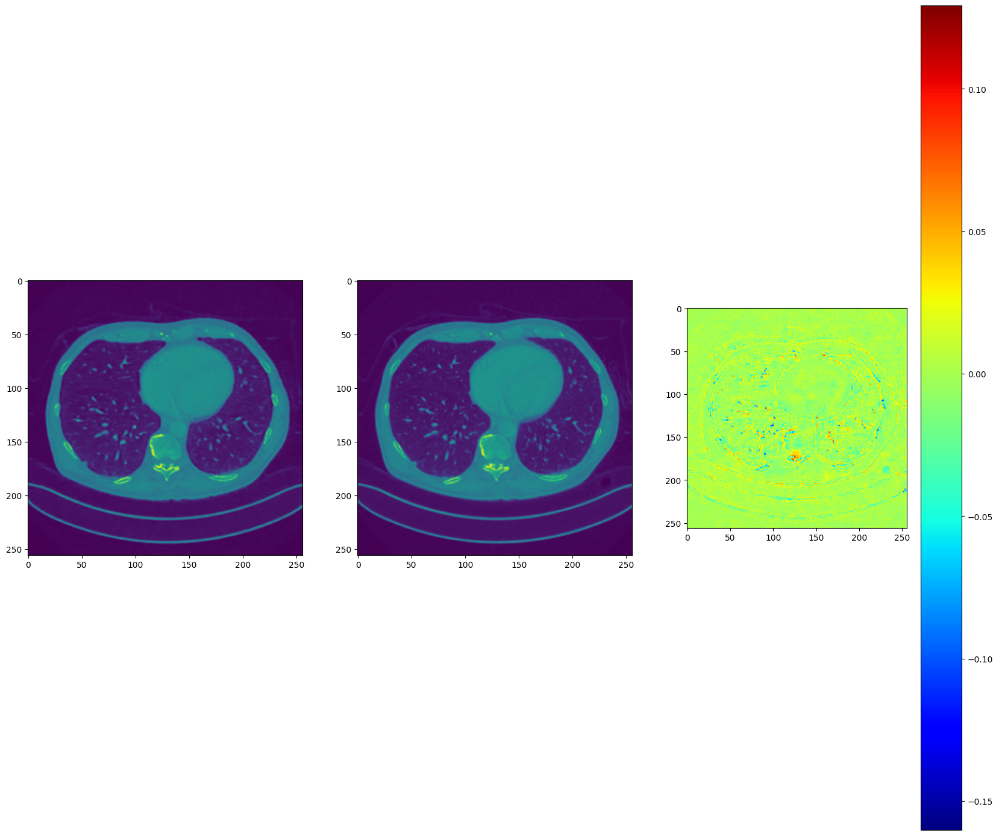

In [136]:
plt.figure(figsize=(20,20))
plt.subplot(131)
plt.imshow(generated_0430.cpu().squeeze(0).squeeze(0))
plt.subplot(132)
plt.imshow(generated0_0426.cpu().squeeze(0).squeeze(0))
plt.subplot(133)
plt.imshow(np.subtract(generated0_0426.cpu().squeeze(0).squeeze(0),generated_0430.cpu().squeeze(0).squeeze(0)),cmap='jet')
plt.colorbar()

In [55]:
# 푸리에 변환 적용해보기 
img = input0.squeeze(0).permute(1,2,0).squeeze()
generated_img = generated0.cpu().squeeze(0).permute(1,2,0).squeeze()
target_img = target0.squeeze(0).permute(1,2,0).squeeze()

print(f'shape 확인 : {img.shape},{generated_img.shape}, {target_img.shape}')

f = np.fft.fft2(img)
f_g = np.fft.fft2(generated_img)
f_t = np.fft.fft2(target_img)


fshift = np.fft.fftshift(f)
fshift_g = np.fft.fftshift(f_g)
fshift_t = np.fft.fftshift(f_t)



magnitude_spectrum = 20 * np.log(np.abs(fshift))
magnitude_spectrum_g = 20 * np.log(np.abs(fshift_g))
magnitude_spectrum_t = 20 * np.log(np.abs(fshift_t))

# 30 ~ 40

# mask = (magnitude_spectrum>=100) & (magnitude_spectrum <=150)
# mask = np.ones_like(img.squeeze())

# print(img.squeeze().shape) # 256,256

# mask[200:250, 200:250] = 0

# 마스크를 주파수 신호에 곱한다. 

# _, _, rows, cols = input0.shape

# crow, ccol = rows//2, cols//2

# fshift_sq = np.squeeze(fshift)
# fshift_filtered = fshift_sq  * mask

# # 푸리에 변환 결과를 다시 이미지로 변환

# f_ishift = np.fft.ifftshift(fshift_filtered)
# img_back = np.fft.ifft2(f_ishift)
# img_back = np.abs(img_back)

# plt.figure(figsize=  (20,20))
# plt.subplot(221)
# plt.imshow(img,cmap='gray')
# plt.title('Input')
# plt.xticks([])
# plt.yticks([])

# plt.subplot(222)
# plt.imshow(magnitude_spectrum,cmap='gray')
# plt.title('Spectrum')
# plt.xticks([])
# plt.yticks([])


# plt.subplot(223)
# plt.imshow(img_back,cmap='gray')
# plt.title('spectrum filtering img')
# plt.xticks([])
# plt.yticks([])


# img_back_tensor = torch.from_numpy(img_back)

# # print(f'img_back_tensor :{img_back_tensor.shape}') # 256,256
# # torch.Size([256, 256, 1])

# plt.subplot(224)
# plt.imshow(np.subtract(img, img_back_tensor),cmap='jet')
# plt.title('Original - F')
# plt.colorbar()
# plt.show()

shape 확인 : torch.Size([256, 256]),torch.Size([256, 256]), torch.Size([256, 256])


origin diff : 7.451091276569546
t - g diff : 7.501303931929934


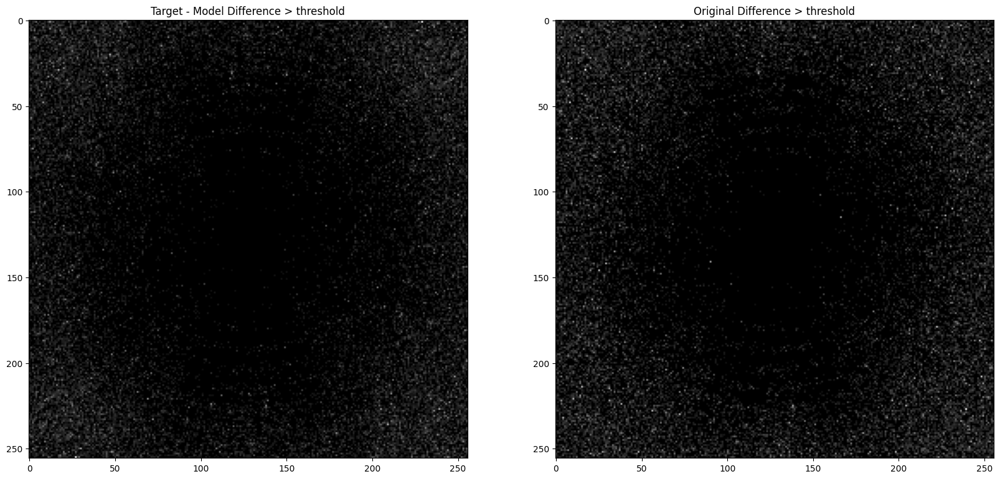

In [56]:
# plt.figure(figsize = (20,20))
# plt.subplot(131)
# plt.imshow(magnitude_spectrum,cmap='gray')

# plt.title('magnitude_spectrum Input')
# plt.subplot(132)
# plt.imshow(magnitude_spectrum_g,cmap='gray')
# plt.title('Generated Spectrum')
# plt.subplot(133)
# plt.imshow(magnitude_spectrum_t, cmap='gray')
# plt.title('Full Dose Magnitude spectrum')
# plt.show()



diff = np.abs(np.subtract(magnitude_spectrum_t ,magnitude_spectrum_g))
diff_origin = np.abs(np.subtract(magnitude_spectrum_t,magnitude_spectrum))
threshold = np.mean(diff_origin)
print(f'origin diff : {threshold}')

print(f't - g diff : {np.mean(diff)}')

plt.figure(figsize =(20,20))
plt.subplot(121)
plt.title('Target - Model Difference > threshold')
thresholded_t_g = np.where(diff > threshold, diff, 0)
plt.imshow(thresholded_t_g,cmap='gray')
plt.subplot(122)
plt.title('Original Difference > threshold')
thresholded_t_g = np.where(diff_origin >threshold , diff_origin, 0)
plt.imshow(thresholded_t_g ,cmap='gray')


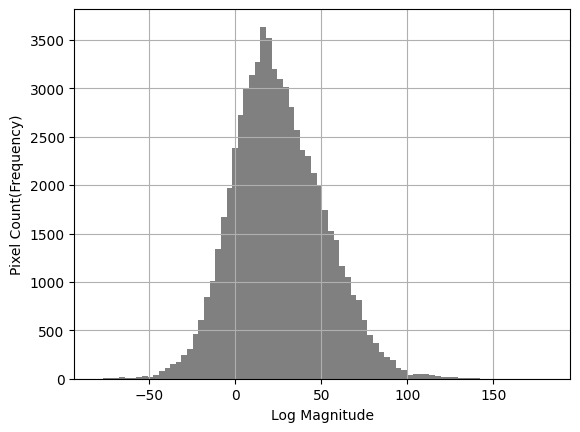

In [93]:
# 주파수 히스토그램


# plt.hist(magnitude_spectrum_g.ravel(),bins = 80, color='gray',range = [magnitude_spectrum.min(),magnitude_spectrum.max()])


# plt.hist(magnitude_spectrum.ravel(),bins = 80, color='gray',range = [magnitude_spectrum.min(),magnitude_spectrum.max()])

plt.hist(magnitude_spectrum_t.ravel(),bins = 80, color='gray',range = [magnitude_spectrum.min(),magnitude_spectrum.max()])

plt.xlabel('Log Magnitude')
plt.ylabel('Pixel Count(Frequency)')
plt.grid(True)


/tmp/ipykernel_57/269576170.py:14: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  plt.imshow(np.abs(np.subtract(img,generated_img)),cmap='gray')


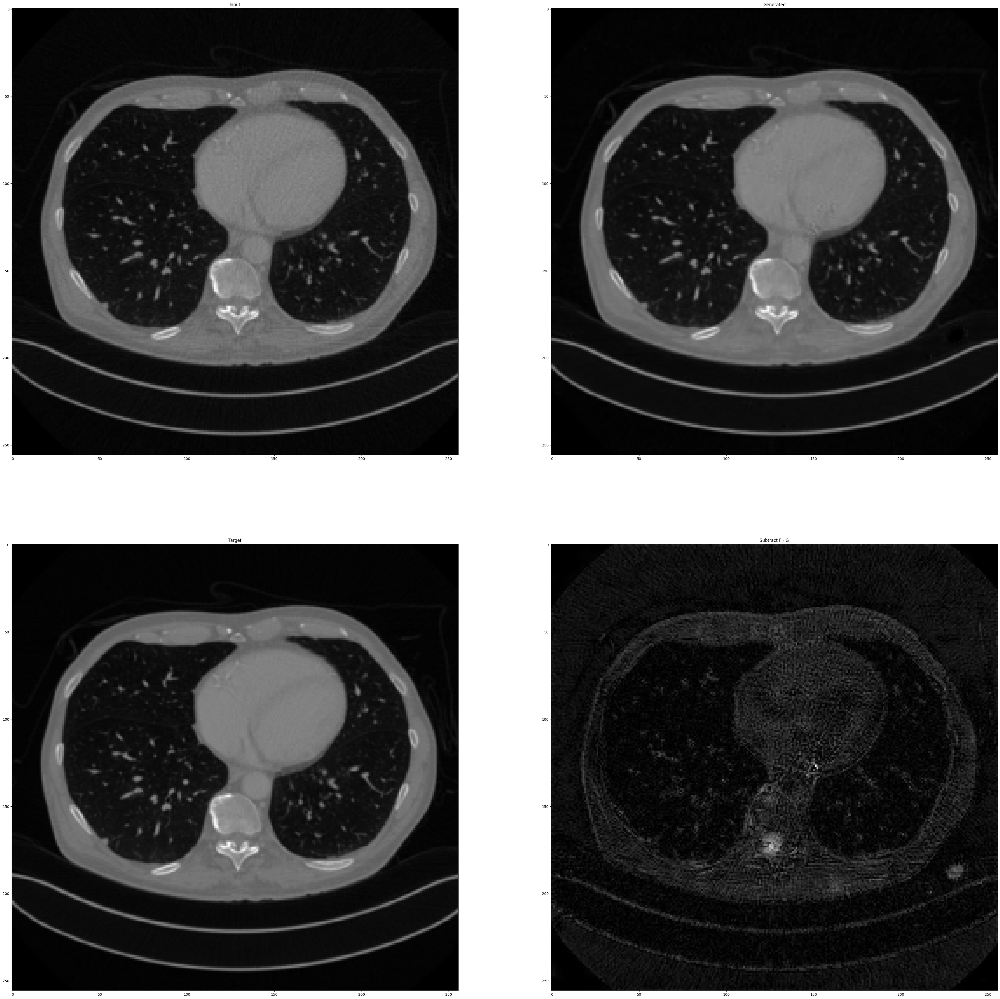

In [97]:
plt.figure(figsize = (50,50))
plt.subplot(221)
plt.title('Input')
plt.imshow(img,cmap='gray')
plt.subplot(222)
plt.title('Generated')
plt.imshow(generated_img,cmap='gray')
plt.subplot(223)
plt.title('Target')
plt.imshow(target_img,cmap='gray')

plt.subplot(224)
plt.title('Subtract F - G')
plt.imshow(np.abs(np.subtract(img,generated_img)),cmap='gray')

# discriminator 모델 업데이트 kernel size 16 -> 3 후 결과
- Loss : GAN loss, L1 Loss, Sobel Loss 

- 1mm & Sharp
input-target
psnr : 35.967973151259066, ssim: 0.9507685631167124
target-generated
psnr : 40.571986069580284, ssim: 0.9763684874585977
----------
- 1mm & Soft
input-target
psnr : 43.33129508816138, ssim: 0.9738630423104997
target-generated
psnr : 43.174850354369205, ssim: 0.9827487100794082
----------
- 3mm & Sharp
input-target
psnr : 44.16470127591185, ssim: 0.9790462139101439
target-generated
psnr : 44.493305441199034, ssim: 0.9879549496473211
----------
- 3mm & Soft
input-target
psnr : 47.58580674489005, ssim: 0.9912987823412576
target-generated
psnr : 41.65113483679449, ssim: 0.9879577685829934



- 1mm & Sharp
input-target
psnr : 35.967973151259066, ssim: 0.9507685631167124
target-generated
psnr : 33.069386687272704, ssim: 0.955121086497742
----------
- 1mm & Soft
input-target
psnr : 43.33129508816138, ssim: 0.9738630423104997
target-generated
psnr : 36.42071597435763, ssim: 0.9650144327150566
----------
- 3mm & Sharp
input-target
psnr : 44.16470127591185, ssim: 0.9790462139101439
target-generated
psnr : 36.88421610767506, ssim: 0.9682664357109171
----------
- 3mm & Soft
input-target
psnr : 47.58580674489005, ssim: 0.9912987823412576
target-generated
psnr : 35.87177748777592, ssim: 0.9706370949024814

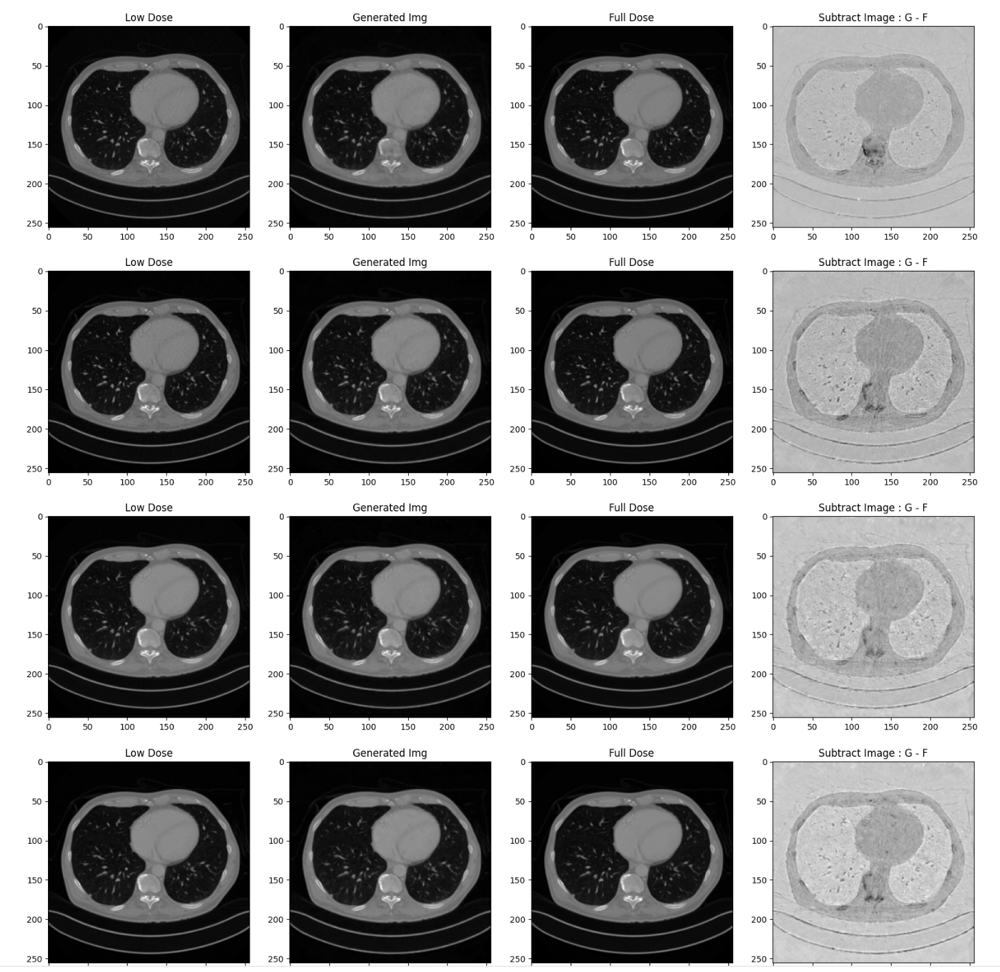


# L1 Loss 추가 후 5 epoch 더 돌린 결과

- 1mm & Sharp
input-target
psnr : 35.967973151259066, ssim: 0.9507685631167124
target-generated
psnr : 31.803047144072533, ssim: 0.9433319187521239
----------
- 1mm & Soft
input-target
psnr : 43.33129508816138, ssim: 0.9738630423104997
target-generated
psnr : 39.1082938537206, ssim: 0.9671751832267257
----------
- 3mm & Sharp
input-target
psnr : 44.16470127591185, ssim: 0.9790462139101439
target-generated
psnr : 40.60911013114813, ssim: 0.9743790635435355

- 3mm & Soft
input-target
psnr : 47.58580674489005, ssim: 0.9912987823412576
target-generated
psnr : 38.96142055505566, ssim: 0.9750473083469902

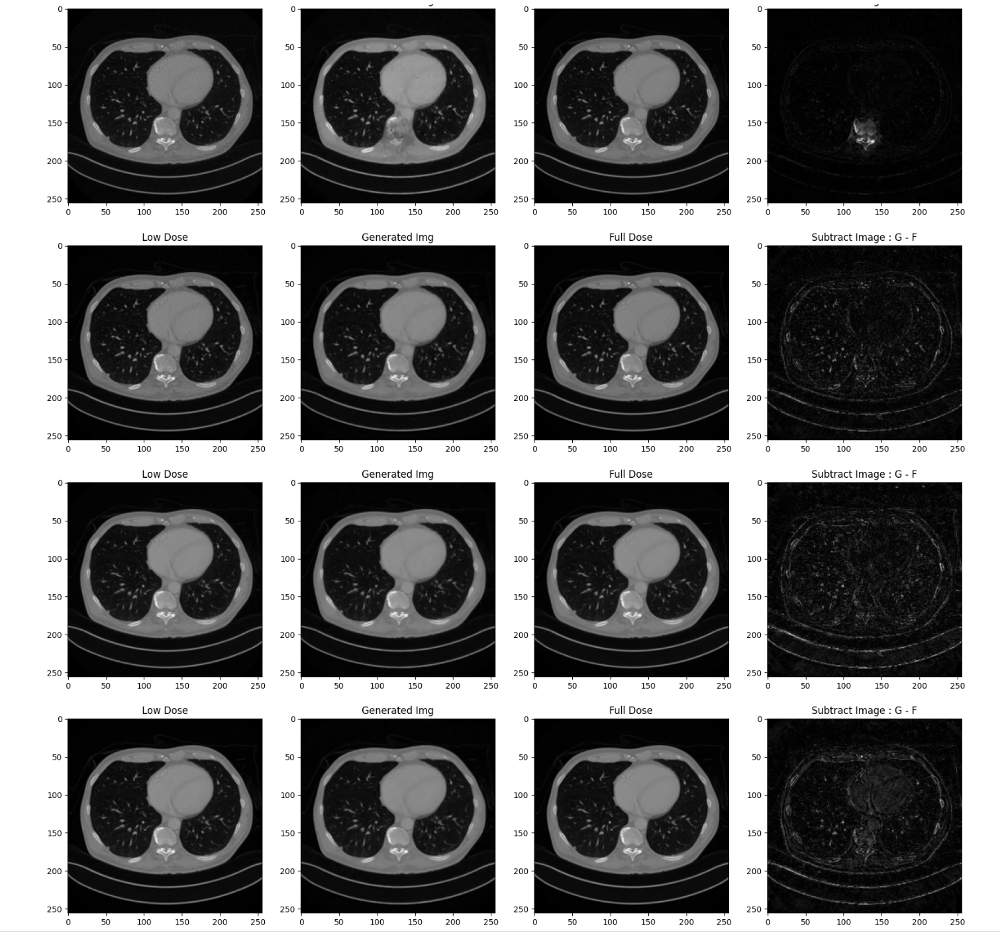

# L1 Loss 추가 후 10 epoch 더 돌린 결과
- 1mm & Sharp
input-target
psnr : 35.967973151259066, ssim: 0.9507685631167124
target-generated
psnr : 30.13707482989688, ssim: 0.9219296935038344

- 1mm & Soft
input-target
psnr : 43.33129508816138, ssim: 0.9738630423104997
target-generated
psnr : 34.43359391429011, ssim: 0.9546355596233612

- 3mm & Sharp
input-target
psnr : 44.16470127591185, ssim: 0.9790462139101439
target-generated
psnr : 35.743029504431505, ssim: 0.9618202753769408

- 3mm & Soft
input-target
psnr : 47.58580674489005, ssim: 0.9912987823412576
target-generated
psnr : 36.61471970689774, ssim: 0.9654293508655866


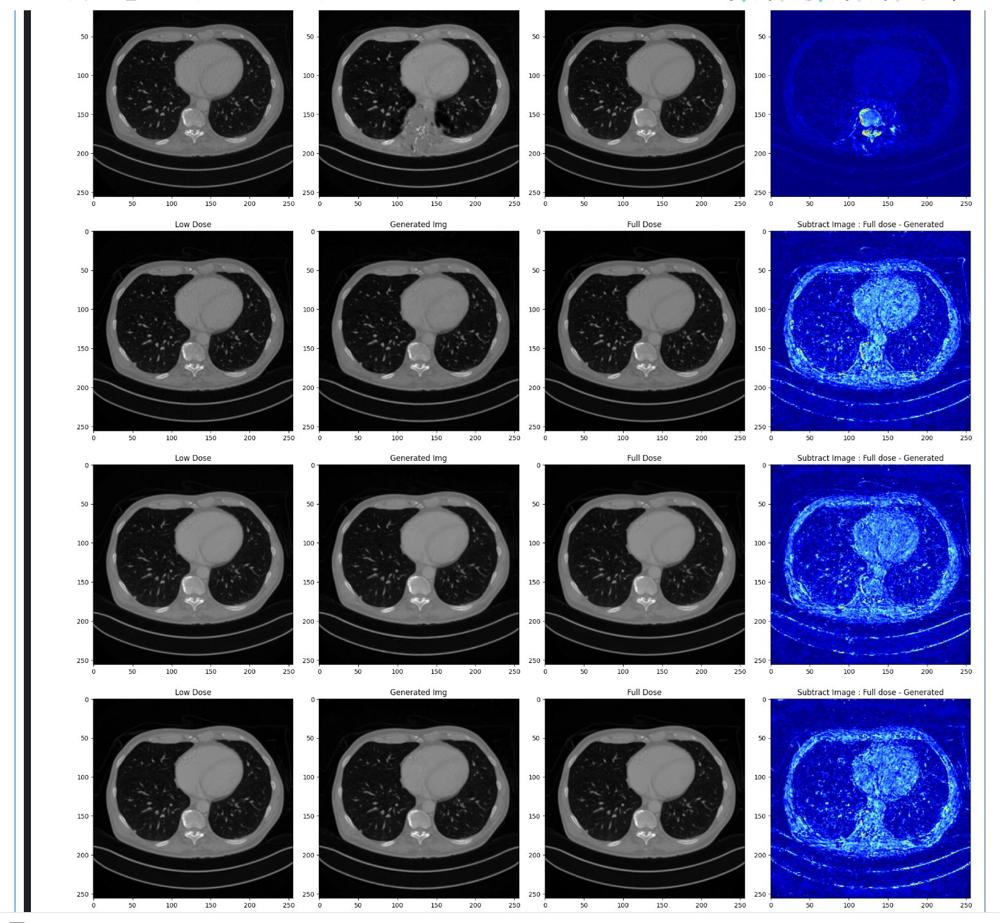



tensor([3, 0])


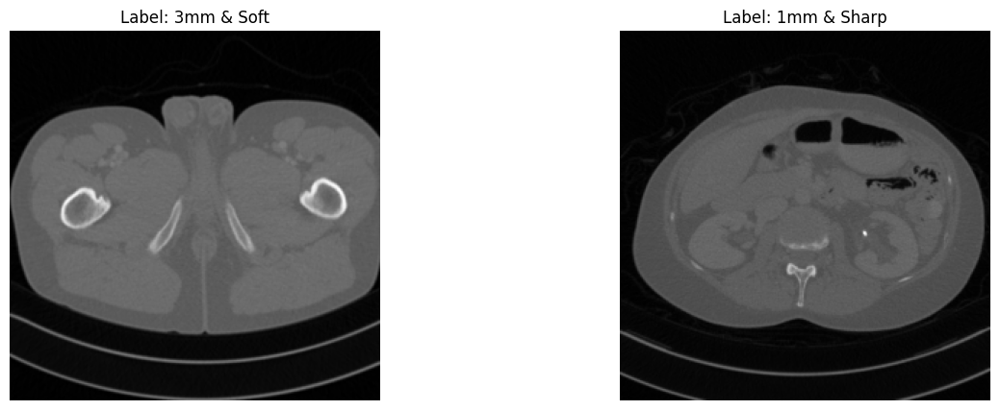

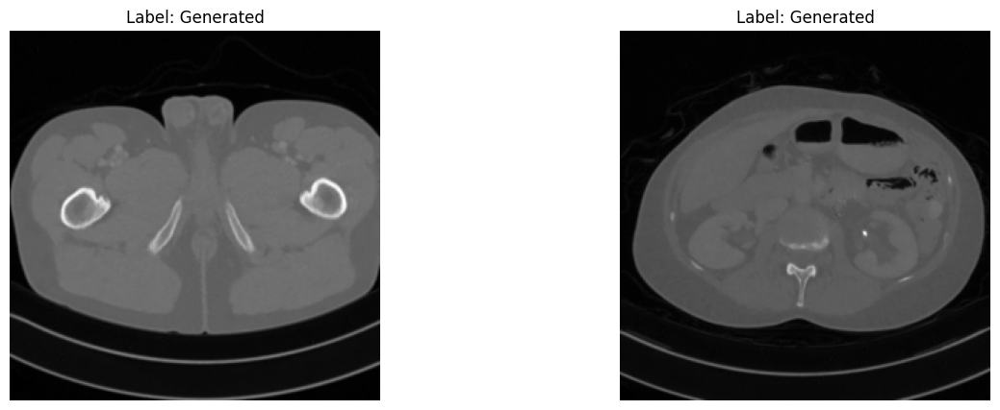

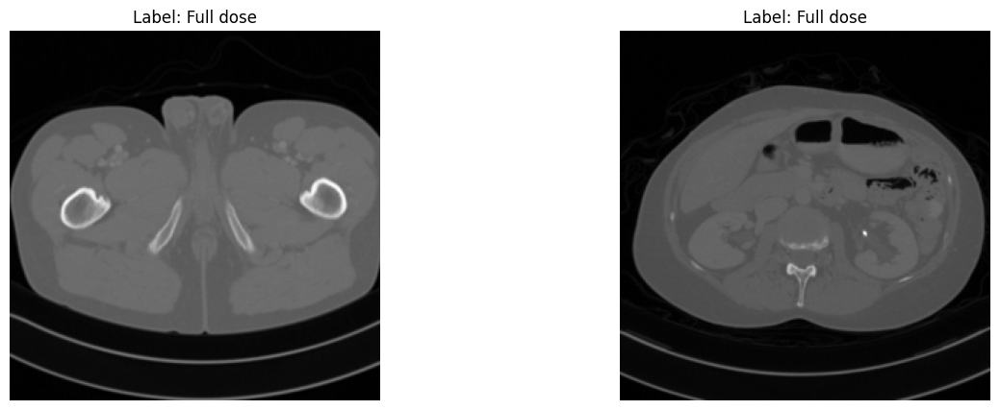

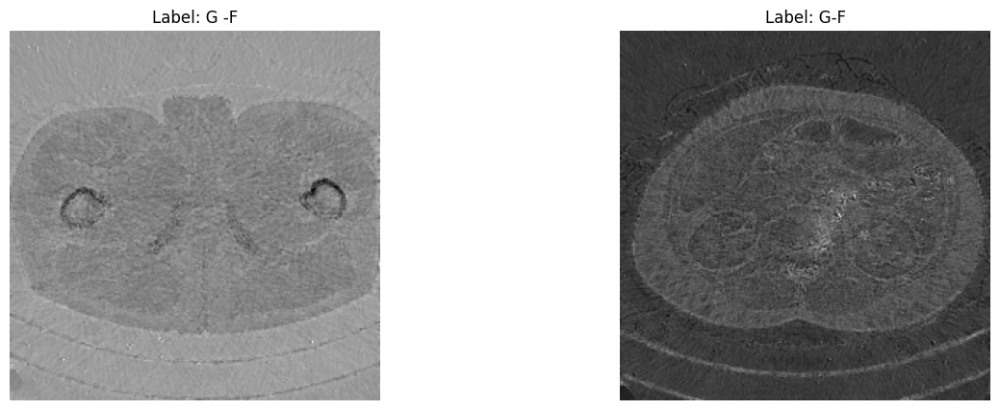

psnr : 40.074702404017955, ssim : 0.9853543359427073
psnr2: 39.78801753574529, ssim2 : 0.9821360788634771


In [35]:
generator.eval()

low_dose_ct,full_ct,label = next(iter(ct_test_dataloader))

print(label)
def get_label_str(label_list):
    label_str = []
    for label in label_list:
        if label == 0 : 
            label_str.append('1mm & Sharp')
        elif label == 1:
            label_str.append('1mm & Soft')
        elif label ==2:
           label_str.append('3mm & Sharp')
        else:
            label_str.append('3mm & Soft')
    return label_str
    

generated_img = make_ct_image(low_dose_ct,label,generator)

# print(f'generated_img 범위 : {generated_img.min()}, {generated_img.max()}') # 0 ~ 1
# print(f'full_ct 범위 : {full_ct.min()}, {full_ct.max()}') # 0  ~1 

# label_list = ['Low dose' + get_label_str(label),'Low dose']

show_images(low_dose_ct,label_list = get_label_str(label))

label_list = ['Generated','Generated']

show_images(generated_img,label_list = label_list)

label_list = ['Full dose','Full dose']

show_images(full_ct,label_list = label_list)

minus = generated_img.cpu() - full_ct.cpu()

show_images(minus, label_list = ['G -F','G-F'])

psnr = get_psnr(full_ct[0],generated_img[0])
ct_ssim = get_ssim(full_ct[0],generated_img[0])

psnr2 = get_psnr(full_ct[1],generated_img[1])
ct_ssim2 = get_ssim(full_ct[1],generated_img[1])

print(f'psnr : {psnr}, ssim : {ct_ssim}')
print(f'psnr2: {psnr2}, ssim2 : {ct_ssim2}')

### 최종 모델 model_V5 버전

In [ ]:
# low_dose_ct,full_ct,label = next(iter(ct_test_dataloader))

# def get_test_img(img_path):
#     input_tensor = torch.tensor(load_and_preprocessing(img_path)).unsqueeze(0)
#     transform = transforms.Resize((256,256))
#     resized_img =  transform(input_tensor).squeeze()
#     return resized_img
    
# # 조건 0 :  Quater -  1mm & Sharp
# input0_path = '/kaggle/input/datasets/andrewmvd/ct-low-dose-reconstruction/CT_low_dose_reconstruction_dataset/Original Data/Quarter Dose/1mm Slice Thickness/Sharp Kernel (D45)/L506/L506_QD_1_SHARP_1.CT.0004.0001.2016.01.21.18.23.46.898560.404787186.IMA'
# full0_path='/kaggle/input/datasets/andrewmvd/ct-low-dose-reconstruction/CT_low_dose_reconstruction_dataset/Original Data/Full Dose/1mm Slice Thickness/Sharp Kernel (D45)/L506/L506_FD_1_SHARP_1.CT.0002.0001.2016.01.21.18.23.22.704560.404554160.IMA'
# resized_img0 = get_test_img(input0_path).unsqueeze(0).unsqueeze(0)
# resized_full0= get_test_img(full0_path).unsqueeze(0).unsqueeze(0)
# generated_img0 = make_ct_image(resized_img0,label=torch.tensor([0]))

#  # 조건 1 :  Quater-  1mm & Soft
# input1_path = '/kaggle/input/datasets/andrewmvd/ct-low-dose-reconstruction/CT_low_dose_reconstruction_dataset/Original Data/Quarter Dose/1mm Slice Thickness/Soft Kernel (B30)/L506/L506_QD_1_1.CT.0004.0001.2015.12.22.20.46.00.71702.358796480.IMA'
# resized_img1 = get_test_img(input1_path).unsqueeze(0).unsqueeze(0)
# full1_path = '/kaggle/input/datasets/andrewmvd/ct-low-dose-reconstruction/CT_low_dose_reconstruction_dataset/Original Data/Full Dose/1mm Slice Thickness/Soft Kernel (B30)/L506/L506_FD_1_1.CT.0002.0001.2015.12.22.20.19.52.894480.358589814.IMA'
# resized_full1 = get_test_img(full1_path).unsqueeze(0).unsqueeze(0)
# generated_img1 = make_ct_image(resized_img1,label=torch.tensor([1]))


# # 조건 2 : Quater - 3mm & Sharp
# input2_path = '/kaggle/input/datasets/andrewmvd/ct-low-dose-reconstruction/CT_low_dose_reconstruction_dataset/Original Data/Quarter Dose/3mm Slice Thickness/Sharp Kernel (D45)/L506/L506_QD_3_SHARP_1.CT.0003.0001.2016.01.21.18.23.35.89560.404744517.IMA'
# resized_img2 = get_test_img(input2_path).unsqueeze(0).unsqueeze(0)
# full2_path = '/kaggle/input/datasets/andrewmvd/ct-low-dose-reconstruction/CT_low_dose_reconstruction_dataset/Original Data/Full Dose/3mm Slice Thickness/Sharp Kernel (D45)/L506/full_3mm_sharp/L506_FD_3_SHARP_1.CT.0001.0001.2016.01.21.18.23.12.612560.404533041.IMA'
# resized_full2 = get_test_img(full2_path).unsqueeze(0).unsqueeze(0)
# generated_img2 = make_ct_image(resized_img2,label=torch.tensor([2]))



# # 조건 3 : Quater - 3mm & Soft
# input3_path  = '/kaggle/input/datasets/andrewmvd/ct-low-dose-reconstruction/CT_low_dose_reconstruction_dataset/Original Data/Quarter Dose/3mm Slice Thickness/Soft Kernel (B30)/L506/L506_QD_3_1.CT.0003.0001.2015.12.22.20.45.42.541197.358785619.IMA'
# resized_img3 = get_test_img(input3_path).unsqueeze(0).unsqueeze(0)
# full3_path='/kaggle/input/datasets/andrewmvd/ct-low-dose-reconstruction/CT_low_dose_reconstruction_dataset/Original Data/Full Dose/3mm Slice Thickness/Soft Kernel (B30)/L506/full_3mm/L506_FD_3_1.CT.0001.0001.2015.12.22.20.19.39.34094.358584079.IMA'

# resized_full3 = get_test_img(full3_path).unsqueeze(0).unsqueeze(0)
# generated_img3 = make_ct_image(resized_img3,label=torch.tensor([3]))



# make_ct_image(resized_img0,torch.tensor([0]))

# # show_images(resized_img0,num_images =1,label_list = ['1mm & Sharp'])
# # show_images(generated_img0,num_images =1,label_list = ['Generated 1mm & Sharp'])


# # show_images(resized_img1,num_images =1,label_list = ['1mm & Soft'])
# # show_images(generated_img1,num_images =1,label_list = ['Generated 1mm & Soft'])


# # show_images(resized_img2,num_images =1,label_list = ['3mm & Sharp'])
# # show_images(generated_img2,num_images =1,label_list = ['Generated 3mm & Sharp'])

# show_images(resized_img3,num_images =1,label_list = ['3mm & Soft'])
# show_images(generated_img3,num_images =1,label_list = ['Generated 3mm & Soft'])


# # show_images(make_ct_image(low_dose_ct,label))
# # show_images(full_ct)


# # psnr = get_psnr(resized_full0,generated_img0)
# # ct_ssim = get_ssim(resized_full0,generated_img0)


# # psnr = get_psnr(resized_full1,generated_img1)
# # ct_ssim = get_ssim(resized_full1,generated_img1)


# # psnr = get_psnr(resized_full2,generated_img2)
# # ct_ssim = get_ssim(resized_full2,generated_img2)



# psnr = get_psnr(resized_full3,generated_img3)
# ct_ssim = get_ssim(resized_full3,generated_img3)

# print(f'psnr : {psnr}, ssim : {ct_ssim}')

In [ ]:
# import gc
# gc.collect()
# torch.cuda.empty_cache()

input_path : /kaggle/input/datasets/andrewmvd/ct-low-dose-reconstruction/CT_low_dose_reconstruction_dataset/Original Data/Quarter Dose/1mm Slice Thickness/Sharp Kernel (D45)/L310/L310_QD_1_SHARP_1.CT.0004.0278.2016.01.21.18.21.14.352560.404866370.IMA, 


target_path : /kaggle/input/datasets/andrewmvd/ct-low-dose-reconstruction/CT_low_dose_reconstruction_dataset/Original Data/Quarter Dose/1mm Slice Thickness/Sharp Kernel (D45)/L310/L310_QD_1_SHARP_1.CT.0004.0278.2016.01.21.18.21.14.352560.404866370.IMA